6.4 Google Colab - Extracción de líneas con algoritmo de Canny6.4 Google Colab - Extracción de líneas con algoritmo de Canny6.4 Google Colab - Extracción de líneas con algoritmo de Canny6.4 Google Colab - Extracción de líneas con algoritmo de Canny# **Maestría en Inteligencia Artificial Aplicada**
## **Curso: Inteligencia Artificial y Aprendizaje Automático**
### Tecnológico de Monterrey
### Prof. Gilberto Ochoa Ruiz

## **Actividad Semana 5**
### **5.3 6.4 Google Colab - Extracción de líneas con algoritmo de Canny**

A01793013 - **Jorge Luis Tapia Peñaloza**
<br>
A01793075 - **José Miguel Guerrero Arias**
<br>
A00513236 - **Jesús Ángel Salazar Marcatoma**
<br>
A00968460 - **Josias Ruiz P.**

# 3. Sobel and Canny Edge Detection

## Table of Contents
1. [Libraries](#libraries)
2. [Sobel Edge Detection](#sobel)
3. [Canny Edge Detection](#canny)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import skimage
import numpy as np
from scipy import ndimage
from skimage import exposure
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.ndimage.filters import convolve
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med


from mpl_toolkits.axes_grid1 import ImageGrid


C:\Users\josia\AppData\Local\Temp\ipykernel_27260\1266309624.py:9: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve
C:\Users\josia\AppData\Local\Temp\ipykernel_27260\1266309624.py:10: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter as gauss
C:\Users\josia\AppData\Local\Temp\ipykernel_27260\1266309624.py:11: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import median_filter as med


## Sobel Edge Detection <a class="anchor" id="sobel" ></a>

As a first step in extracting features, you will apply the Sobel edge detection algorithm. This finds regions of the image with large gradient values in multiple directions. Regions with high omnidirectional gradient are likely to be edges or transitions in the pixel values. 

The code in the cell below applies the Sobel algorithm to the median filtered image, using these steps:

1. Convert the color image to grayscale for the gradient calculation since it is two dimensional.
2. Compute the gradient in the x and y (horizontal and vertical) directions. 
3. Compute the magnitude of the gradient.
4. Normalize the gradient values. 

In [2]:
def edge_sobel(image):
    from scipy import ndimage
    import skimage.color as sc
    import numpy as np
    image = sc.rgb2gray(image) # Convert color image to gray scale
    dx = ndimage.sobel(image, 1)  # horizontal derivative
    dy = ndimage.sobel(image, 0)  # vertical derivative
    mag = np.hypot(dx, dy)  # magnitude
    mag *= 255.0 / np.amax(mag)  # normalize (Q&D)
    mag = mag.astype(np.uint8)
    return mag

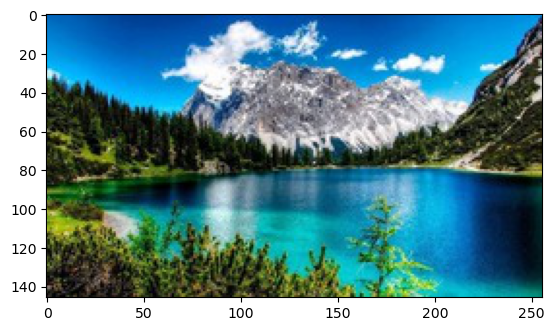

In [3]:
filename = 'image'

img = Image.open( filename + '.jpg' )
data = np.array( img, dtype='uint8' )

np.save( filename + '.npy', data)

# visually testing our output
img_array = np.load(filename + '.npy')
plt.imshow(img_array) 


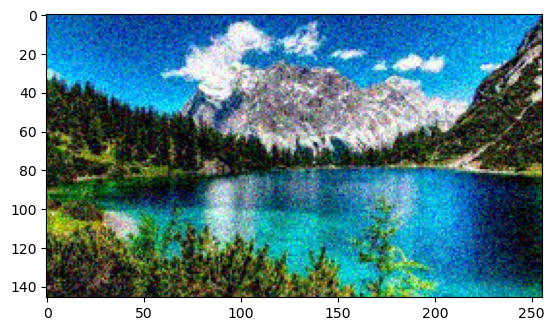

In [4]:
original_image = np.load('image.npy')

img = skimage.util.random_noise(original_image)
plt.imshow(img)

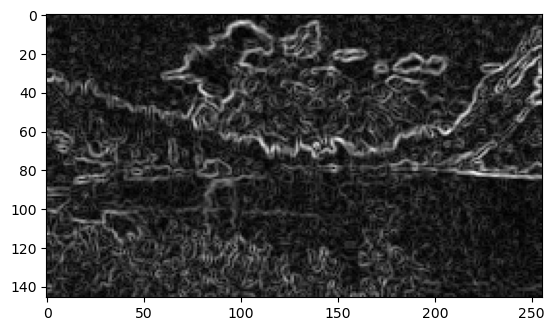

In [5]:
img_med = med(img, size=2)
img_edge = edge_sobel(img_med)
plt.imshow(img_edge, cmap="gray")

Now let's try with the more blurred gaussian filtered image.

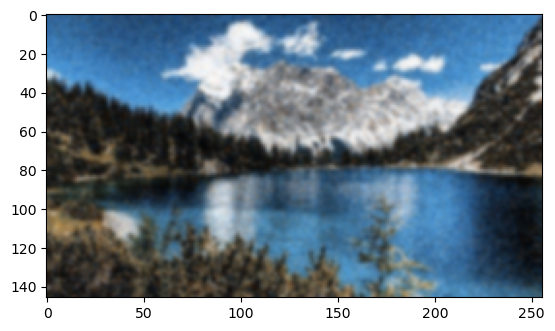

In [6]:
img_gauss = gauss(img, sigma=1)   
plt.imshow(img_gauss)

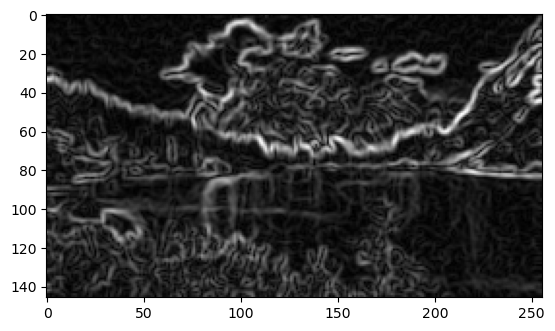

In [7]:
img_edge = edge_sobel(img_gauss)
plt.imshow(img_edge, cmap="gray")

## Canny Edge Detection <a class="anchor" id="canny" ></a>

Steps:
1. Noise Reduction
2. Gradient Calculation
3. Non-maximum Supression
4. Double Threshold
5. Edge Tracking by Hysteresis

**Pre-requisite:** Convert the image to grayscale before algorithm.

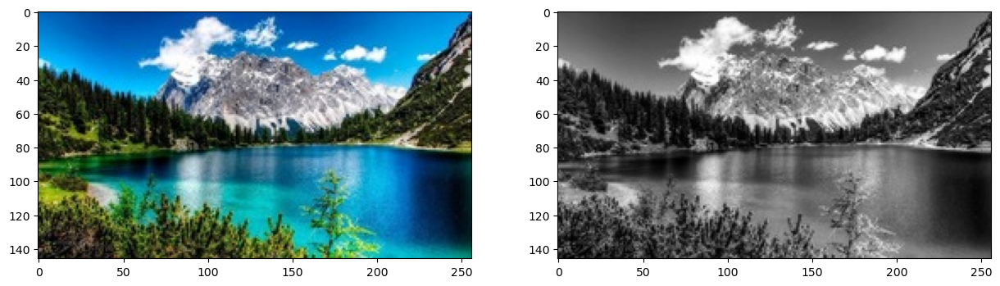

In [8]:
img = cv2.imread('image.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### 1. Noise Reduction
Edge detection are highly sensitive to image noise due to the derivatives behind the algorithm.

We can apply a Gaussian Kernel, the size of the kernel depends on the expected blurring effect. The smaller the less blurring effect.

Equation for Gaussian Kernel of size $(2k+1) \times (2k+1)$

$$
H_{i, j} = \frac{1}{2\pi\sigma^2}exp(-\frac{(i-(k+1))^2 + (j-(k+1))^2}{2\sigma^2}); 1\leq i, j \leq (2k+1)
$$

In [9]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

### 1.1 Sigma Parameter $\sigma$

In [10]:
# Change this parameter
sigma = 12.5 # 1, 3, 5, 10, 20, ...

### 1.2 Kernel Size Parameter

In [11]:
kernel_size = 3

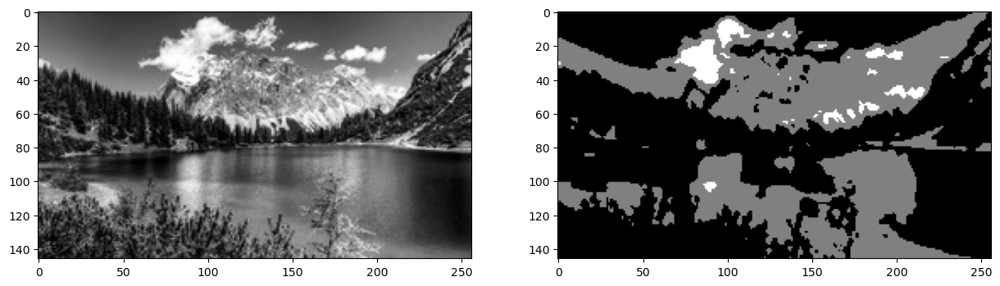

In [12]:
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

### 2. Gradient Calculation

Edges correspond to a change of pixels intensity. 

To detect it, the easiest way is to apply filters that highlight this intensity change in both directions: 
- horizontal $(x)$ 
- and vertical $(y)$

It can be implemented by convoling $I$ with *Sobel kernels* $Kx$ and $Ky$

$$
K_x = \begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix}, K_y = \begin{bmatrix}
1 & 2& 1\\
0 & 0 & 0\\
-1 & -2 & -1
\end{bmatrix}
$$

Then, the magnitude $G$ and the slope $\theta$ of the gradient are calculated as follow:

$$
|G| = \sqrt{I_x^2 + I_y^2},
\theta(x, y) = arctan(\frac{I_y}{I_x})
$$

In [13]:
def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)
    
    Ix = ndimage.filters.convolve(img, Kx)
    Iy = ndimage.filters.convolve(img, Ky)
    
    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)
    
    return (G, theta)

C:\Users\josia\AppData\Local\Temp\ipykernel_27260\65442114.py:5: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Ix = ndimage.filters.convolve(img, Kx)
C:\Users\josia\AppData\Local\Temp\ipykernel_27260\65442114.py:6: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Iy = ndimage.filters.convolve(img, Ky)


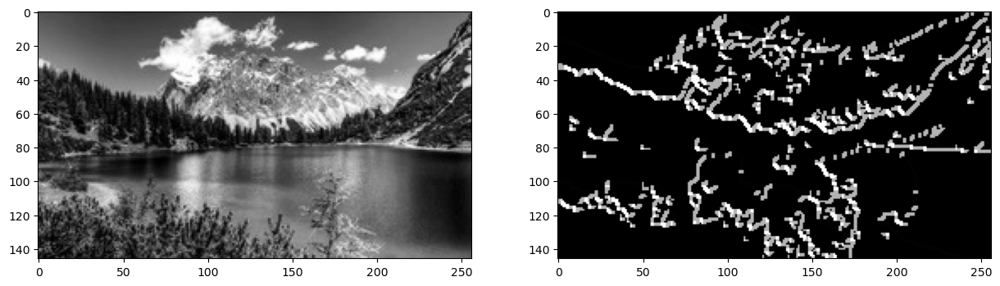

In [14]:
G, theta = sobel_filters(img_gaussian)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(G, cmap="gray")

### 3. Non-Maximum supression

1. Create a matrix initialized to 0 of the same size of the original gradient intensity matrix
2. Identify the edge direction based on the angle value from the angle matrix
3. Check if the pixel in the same direction has a higher intensity than the pixel that is currently processed
4. Return the image processed with the non-max suppression algorithm.

In [15]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180

    
    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255
                
               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass
    
    return Z

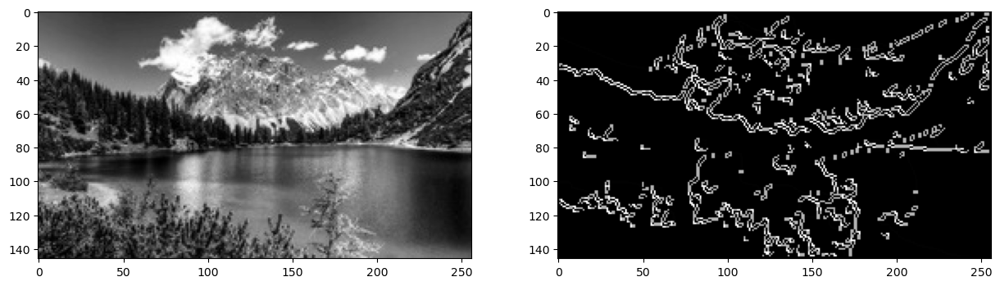

In [16]:
img_nonmax = non_max_suppression(G, theta)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_nonmax, cmap="gray")

### 4. Double threshold

- Strong pixels are pixels that have an intensity so high that we are sure they contribute to the final edge.
- Weak pixels are pixels that have an intensity value that is not enough to be considered as strong ones, but yet not small enough to be considered as non-relevant for the edge detection.
- Other pixels are considered as non-relevant for the edge.

In [17]:
def threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.09):
    
    highThreshold = img.max() * highThresholdRatio;
    lowThreshold = highThreshold * lowThresholdRatio;
    
    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)
    
    weak = np.int32(25)
    strong = np.int32(255)
    
    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)
    
    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))
    
    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak
    
    return (res)

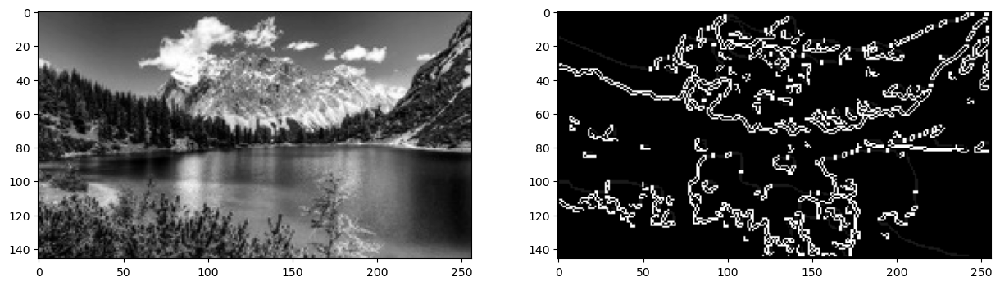

In [18]:
img_threshold = threshold(img_nonmax)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_threshold, cmap="gray")

### 5. Edge Tracking by Hysteresis

The hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one

In [19]:
def hysteresis(img, weak = 75, strong=255):
    M, N = img.shape  
    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i,j] == weak):
                try:
                    if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                        or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                        or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass
    return img

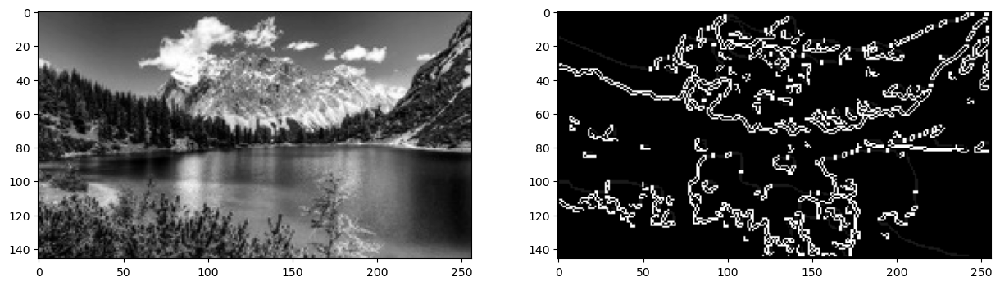

In [20]:
img_final = hysteresis(img_threshold)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_final, cmap="gray")

In [21]:
# TODO: Challenge

# Ejercicios

En este proyecto no pediremos extensiones o nuevas funciones. Sin embargo, se pide que se modifiquen algunos parámetros para que se comprenda mejor el codigo:  a) modifica el valor de sigma y observa los cambios en las lineas detectas, b) Analiza el comportamiento del Canny Detector con y sin remoción de ruido, c) Experimenta con imágenes con diferentes cantidad de lineas y textura para observar el comportamiento del algoritmo

## a) modifica el valor de sigma y observa los cambios en las lineas detectas

In [22]:
filename = 'crosswalk'

img = Image.open( filename + '.jpg' )
data = np.array( img, dtype='uint8' )

np.save( filename + '.npy', data)


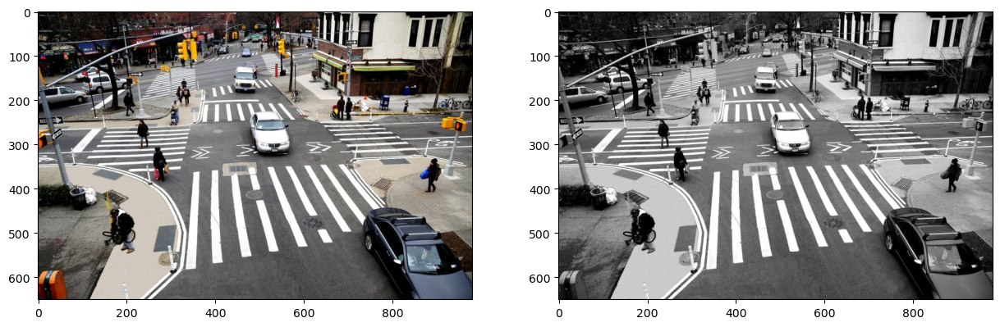

In [23]:
#grayscale
img = cv2.imread('crosswalk.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")


Text(0.5, 1.0, 'Gaussian-sigma 17')

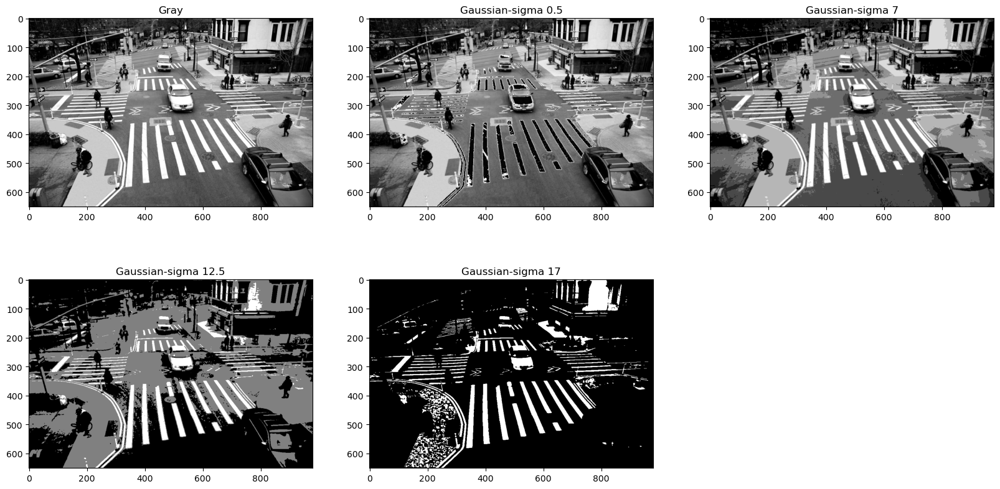

In [24]:
#Noise Reduction
img_gaussian1 = convolve(img_gray, gaussian_kernel(kernel_size, .5))
img_gaussian2 = convolve(img_gray, gaussian_kernel(kernel_size, 7))
img_gaussian3 = convolve(img_gray, gaussian_kernel(kernel_size, 12.5))
img_gaussian4 = convolve(img_gray, gaussian_kernel(kernel_size, 17))

plt.figure(figsize=(20, 10))
plt.subplot(2, 3, 1)
plt.imshow(img_gray, cmap="gray")
plt.title("Gray")
plt.subplot(2, 3, 2)
plt.imshow(img_gaussian1, cmap="gray")
plt.title("Gaussian-sigma 0.5")
plt.subplot(2, 3, 3)
plt.imshow(img_gaussian2, cmap="gray")
plt.title("Gaussian-sigma 7")
plt.subplot(2, 3, 4)
plt.imshow(img_gaussian3, cmap="gray")
plt.title("Gaussian-sigma 12.5")
plt.subplot(2, 3, 5)
plt.imshow(img_gaussian4, cmap="gray")
plt.title("Gaussian-sigma 17")

Al manipular el parametro de Sigma para el filtro gaussian se observa la pérdida de definición en cada una de las imágenes;  al usar un valor de 17 podemos notar que practicamente tenemos una imágen con gran contraste y por las características de la misma se observan claramente las lineas peatonales bien definidas, esto es muy útil para navegación autónoma.

C:\Users\josia\AppData\Local\Temp\ipykernel_27260\65442114.py:5: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Ix = ndimage.filters.convolve(img, Kx)
C:\Users\josia\AppData\Local\Temp\ipykernel_27260\65442114.py:6: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Iy = ndimage.filters.convolve(img, Ky)


Text(0.5, 1.0, 'Gaussian-sigma 17')

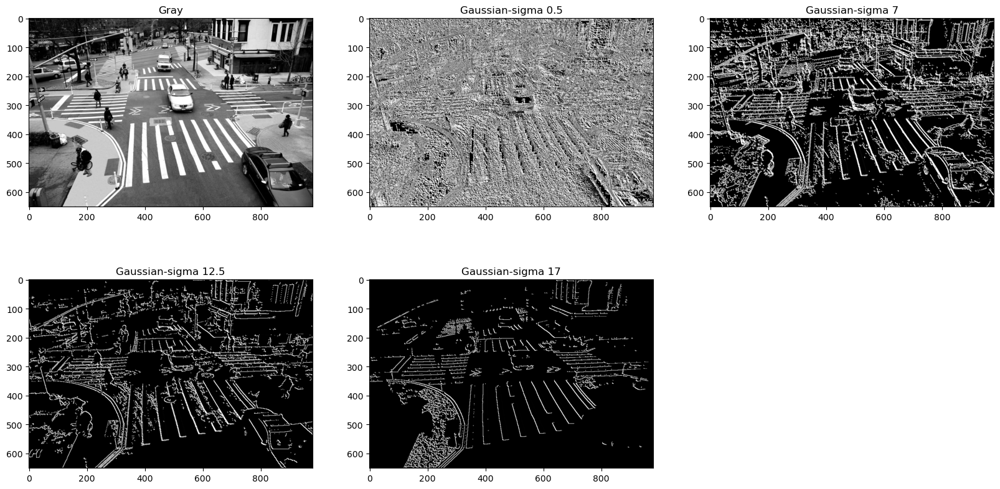

In [25]:
#Gradient Calculation
G1, theta1 = sobel_filters(img_gaussian1)
G2, theta2 = sobel_filters(img_gaussian2)
G3, theta3 = sobel_filters(img_gaussian3)
G4, theta4 = sobel_filters(img_gaussian4)

plt.figure(figsize=(20, 10))
plt.subplot(2, 3, 1)
plt.imshow(img_gray, cmap="gray")
plt.title("Gray")
plt.subplot(2, 3, 2)
plt.imshow(G1, cmap="gray")
plt.title("Gaussian-sigma 0.5")
plt.subplot(2, 3, 3)
plt.imshow(G2, cmap="gray")
plt.title("Gaussian-sigma 7")
plt.subplot(2, 3, 4)
plt.imshow(G3, cmap="gray")
plt.title("Gaussian-sigma 12.5")
plt.subplot(2, 3, 5)
plt.imshow(G4, cmap="gray")
plt.title("Gaussian-sigma 17")

Al calcular el gradiente de las imágenes tratadas con un parámentro sigma diferente para el filtro gaussiano vemos que mientras más grande sea el parámetro sigma mejor definición de las líneas se obtiene.

## b) Analiza el comportamiento del Canny Detector con y sin remoción de ruido

Text(0.5, 1.0, 'Sigma 17 without non-max supression')

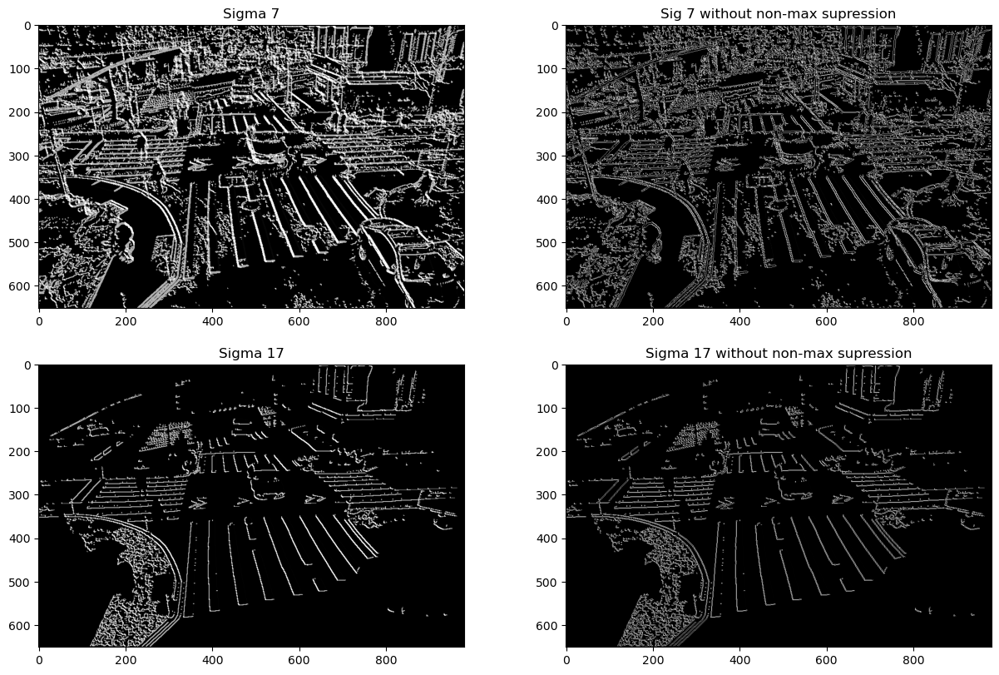

In [26]:
#Non-Maximum supression
img_nonmax2 = non_max_suppression(G2, theta2)
img_nonmax3 = non_max_suppression(G3, theta3)
img_nonmax4 = non_max_suppression(G4, theta4)

plt.figure(figsize=(15, 15))
plt.subplot(3, 2, 1)
plt.imshow(G2, cmap="gray")
plt.title("Sigma 7")
plt.subplot(3, 2, 2)
plt.imshow(img_nonmax2, cmap="gray")
plt.title("Sig 7 without non-max supression")
plt.subplot(3, 2, 3)
plt.imshow(G4, cmap="gray")
plt.title("Sigma 17")
plt.subplot(3, 2, 4)
plt.imshow(img_nonmax4, cmap="gray")
plt.title("Sigma 17 without non-max supression")

Text(0.5, 1.0, 'Sigma 17')

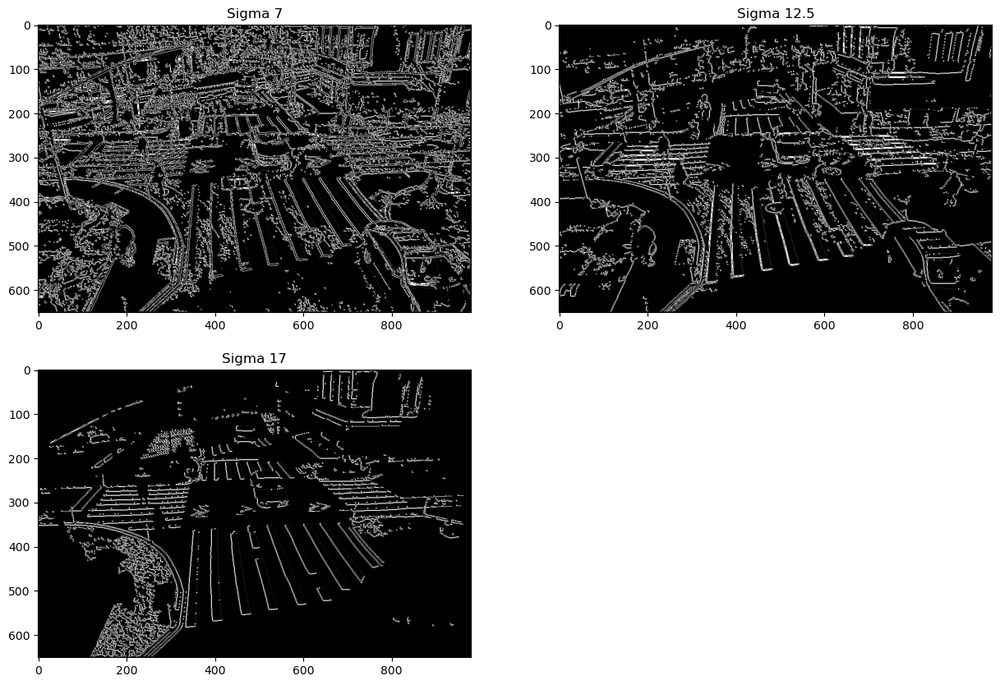

In [27]:
img_threshold2 = threshold(img_nonmax2)
img_threshold3 = threshold(img_nonmax3)
img_threshold4 = threshold(img_nonmax4)

plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.imshow(img_threshold2, cmap="gray")
plt.title("Sigma 7")
plt.subplot(2, 2, 2)
plt.imshow(img_threshold3, cmap="gray")
plt.title("Sigma 12.5")
plt.subplot(2, 2, 3)
plt.imshow(img_threshold4, cmap="gray")
plt.title("Sigma 17")

Text(0.5, 1.0, 'Sigma 17')

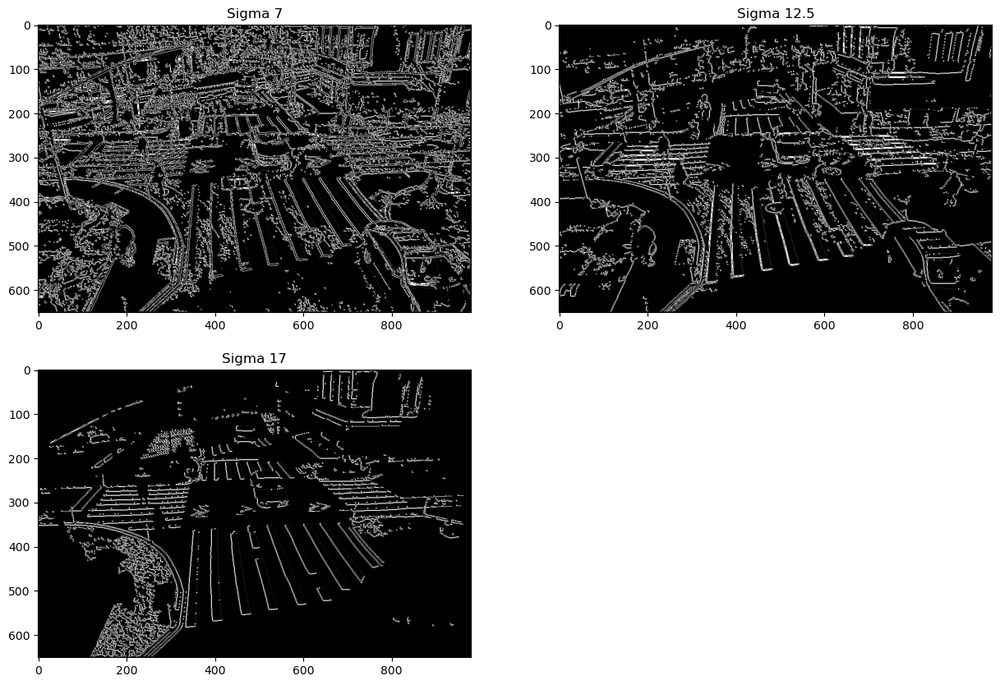

In [28]:
img_final2 = hysteresis(img_threshold2)
img_final3 = hysteresis(img_threshold3)
img_final4 = hysteresis(img_threshold4)

plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.imshow(img_final2, cmap="gray")
plt.title("Sigma 7")
plt.subplot(2, 2, 2)
plt.imshow(img_final3, cmap="gray")
plt.title("Sigma 12.5")
plt.subplot(2, 2, 3)
plt.imshow(img_final4, cmap="gray")
plt.title("Sigma 17")

## Canny Edge Detection - full

### c) Experimenta con imágenes con diferentes cantidad de lineas y textura para observar el comportamiento del algoritmo

C:\Users\josia\AppData\Local\Temp\ipykernel_27260\65442114.py:5: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Ix = ndimage.filters.convolve(img, Kx)
C:\Users\josia\AppData\Local\Temp\ipykernel_27260\65442114.py:6: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Iy = ndimage.filters.convolve(img, Ky)


Text(0.5, 1.0, 'Edge Tracking by Hysteresis')

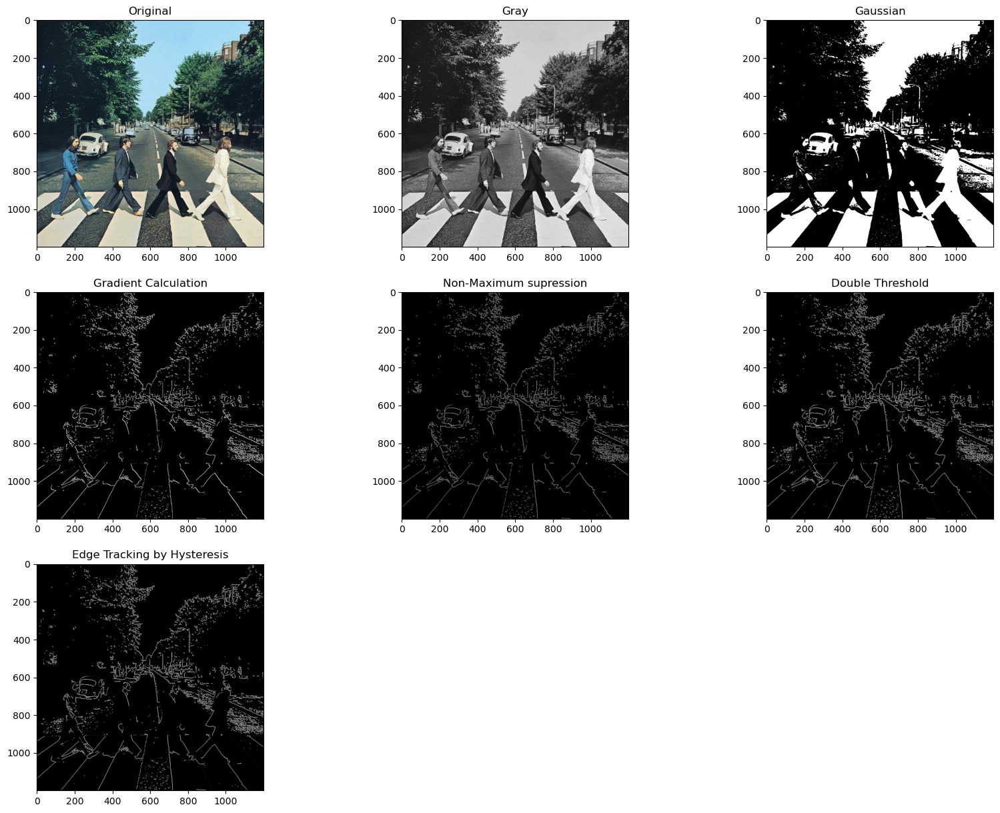

In [29]:
filename = 'AR'

img = Image.open( filename + '.jpg' )
data = np.array( img, dtype='uint8' )

np.save( filename + '.npy', data)

#grayscale
img = cv2.imread('AR.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

sigma=14
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
G, theta = sobel_filters(img_gaussian)
img_nonmax = non_max_suppression(G, theta)
img_threshold = threshold(img_nonmax)
img_final = hysteresis(img_threshold)

plt.figure(figsize=(20, 15))
plt.subplot(3,3,1)
plt.imshow(img_color, cmap="gray")
plt.title("Original")
plt.subplot(3,3,2)
plt.imshow(img_gray, cmap="gray")
plt.title("Gray")
plt.subplot(3, 3, 3)
plt.imshow(img_gaussian, cmap="gray")
plt.title("Gaussian")
plt.subplot(3, 3, 4)
plt.imshow(G, cmap="gray")
plt.title("Gradient Calculation")
plt.subplot(3, 3, 5)
plt.imshow(img_nonmax, cmap="gray")
plt.title("Non-Maximum supression")
plt.subplot(3, 3, 6)
plt.imshow(img_threshold, cmap="gray")
plt.title("Double Threshold")
plt.subplot(3, 3, 7)
plt.imshow(img_final, cmap="gray")
plt.title("Edge Tracking by Hysteresis")

C:\Users\josia\AppData\Local\Temp\ipykernel_27260\65442114.py:5: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Ix = ndimage.filters.convolve(img, Kx)
C:\Users\josia\AppData\Local\Temp\ipykernel_27260\65442114.py:6: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Iy = ndimage.filters.convolve(img, Ky)


Text(0.5, 1.0, 'Edge Tracking by Hysteresis')

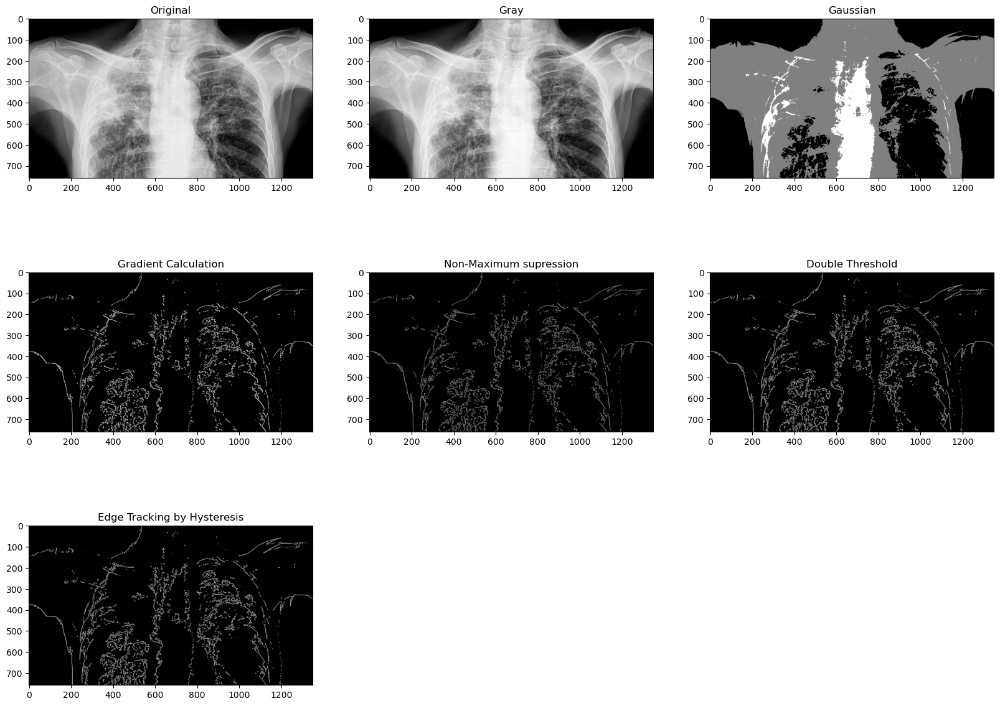

In [30]:
filename = 'xray'

img = Image.open( filename + '.jpg' )
data = np.array( img, dtype='uint8' )

np.save( filename + '.npy', data)

#grayscale
img = cv2.imread('xray.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

sigma = 12.5
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
G, theta = sobel_filters(img_gaussian)
img_nonmax = non_max_suppression(G, theta)
img_threshold = threshold(img_nonmax)
img_final = hysteresis(img_threshold)

plt.figure(figsize=(20, 15))
plt.subplot(3,3,1)
plt.imshow(img_color, cmap="gray")
plt.title("Original")
plt.subplot(3,3,2)
plt.imshow(img_gray, cmap="gray")
plt.title("Gray")
plt.subplot(3, 3, 3)
plt.imshow(img_gaussian, cmap="gray")
plt.title("Gaussian")
plt.subplot(3, 3, 4)
plt.imshow(G, cmap="gray")
plt.title("Gradient Calculation")
plt.subplot(3, 3, 5)
plt.imshow(img_nonmax, cmap="gray")
plt.title("Non-Maximum supression")
plt.subplot(3, 3, 6)
plt.imshow(img_threshold, cmap="gray")
plt.title("Double Threshold")
plt.subplot(3, 3, 7)
plt.imshow(img_final, cmap="gray")
plt.title("Edge Tracking by Hysteresis")

C:\Users\josia\AppData\Local\Temp\ipykernel_27260\65442114.py:5: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Ix = ndimage.filters.convolve(img, Kx)
C:\Users\josia\AppData\Local\Temp\ipykernel_27260\65442114.py:6: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Iy = ndimage.filters.convolve(img, Ky)


Text(0.5, 1.0, 'Edge Tracking by Hysteresis')

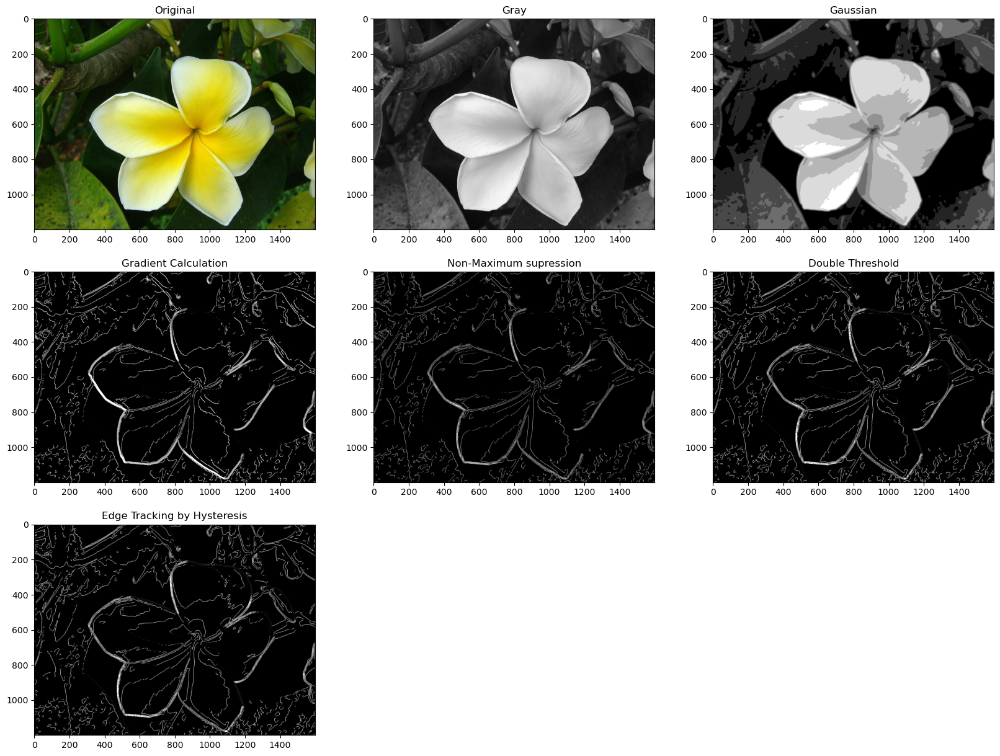

In [31]:
filename = 'flower'

img = Image.open( filename + '.jpg' )
data = np.array( img, dtype='uint8' )

np.save( filename + '.npy', data)

#grayscale
img = cv2.imread('flower.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

sigma = 25
img_gaussian = convolve(img_gray, gaussian_kernel(10, sigma))
G, theta = sobel_filters(img_gaussian)
img_nonmax = non_max_suppression(G, theta)
img_threshold = threshold(img_nonmax)
img_final = hysteresis(img_threshold)

plt.figure(figsize=(20, 15))
plt.subplot(3,3,1)
plt.imshow(img_color, cmap="gray")
plt.title("Original")
plt.subplot(3,3,2)
plt.imshow(img_gray, cmap="gray")
plt.title("Gray")
plt.subplot(3, 3, 3)
plt.imshow(img_gaussian, cmap="gray")
plt.title("Gaussian")
plt.subplot(3, 3, 4)
plt.imshow(G, cmap="gray")
plt.title("Gradient Calculation")
plt.subplot(3, 3, 5)
plt.imshow(img_nonmax, cmap="gray")
plt.title("Non-Maximum supression")
plt.subplot(3, 3, 6)
plt.imshow(img_threshold, cmap="gray")
plt.title("Double Threshold")
plt.subplot(3, 3, 7)
plt.imshow(img_final, cmap="gray")
plt.title("Edge Tracking by Hysteresis")

## Reporta brevemente tus hallazgos al final del Google Collab.

El algoritmo de detección de bordes de Canny es una técnica utilizada para identificar bordes en una imagen. Se utiliza principalmente en visión robótica, movilidad autónoma, procesamiento de imágenes médicas, control de calidad industrial, análisis de video y seguridad, procesamiento de imágenes satelitales, entre otras.

El algoritmo tiene varios pasos clave, que incluyen suavizado gaussiano, cálculo del gradiente, supresión de no máximos, umbral doble y seguimiento de bordes por histéresis.

El suavizado gaussiano se utiliza para reducir el ruido y suavizar la imagen, mientras que el cálculo del gradiente se utiliza para determinar la magnitud y dirección del gradiente para cada píxel en la imagen suavizada. La supresión de no máximos adelgaza la magnitud del gradiente eliminando los valores que no son máximos, lo que resulta en una línea delgada que representa la ubicación del borde. El umbral doble se utiliza para separar los bordes fuertes de los bordes débiles, siendo los bordes fuertes aquellos por encima de un umbral alto y los bordes débiles aquellos entre el umbral alto y bajo. Finalmente, el seguimiento de bordes por histéresis analiza los bordes débiles para determinar si deben incluirse en el mapa de bordes final.

De los ejercicios anteriores se observa la importancia de ajustar los parámetros en función de la imagen y el objetivo para el cual se está aplicando el algoritmo de Canny, es vital tener claro que aspectos de la imagen se quiere resaltar. Se observa que la variación de sigma en el filtro Gaussiano determinara en gran parte el procesamiento de bordes, así como, el ruido impactara en la recopilación de bordes, existe un riesgo que incorporen bordes no relevantes en el análisis.

